#Библиотеки

In [ ]:
!pip install ydata_profiling
!pip install association-metrics -q

In [305]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest
from ydata_profiling import ProfileReport
import association_metrics as am
from scipy.stats import f_oneway
import numpy as np
from scipy import stats

# Общее исследование данных


In [306]:
df = pd.read_csv('online_shoppers_intention.csv')

In [307]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


*Revenue*: Класс-метка, представляющая доход от покупок, совершенных пользователями.

Administrative: Количество страниц, относящихся к административным действиям, посещенных пользователем за сессию.

Administrative Duration: Общее время, проведенное пользователем на административных страницах.

Informational: Количество информационных страниц, посещенных пользователем.

Informational Duration: Время, проведенное на информационных страницах.

Product Related: Количество страниц, связанных с продуктами, которые посетил пользователь.

Product Related Duration: Общее время, проведенное на страницах, связанных с продуктами.

Bounce Rate: Процент посетителей, которые покинули сайт, не совершив никаких действий после входа на страницу.

Exit Rate: Процент пользователей, которые покинули сайт с данной страницы, в качестве последней страницы сессии.

Page Value: Средняя ценность страницы, которую посетил пользователь перед завершением транзакции.

Special Day: Показатель близости даты посещения сайта к специальному дню (например, День матери или День святого Валентина), когда вероятность завершения покупки возрастает.

Operating System: Операционная система, с которой пользователь зашел на сайт.

Browser: Веб-браузер, используемый пользователем для доступа к сайту.

Region: Географический регион, из которого пришел посетитель.

Traffic Type: Тип трафика (например, органический, платный, реферальный и т. д.).

Visitor Type: Тип посетителя — новый или вернувшийся.

Weekend: Булевое значение, указывающее, является ли день посещения выходным.

Month: Месяц, в котором произошло посещение сайта.

In [308]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12131 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  11839 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12231 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [309]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12131.000000,12330.000000,11839.000000,12330.000000,12231.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.724502,31.731468,1190.534914,0.022191,0.043021,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,141.655684,44.475503,1908.447706,0.048488,0.048562,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,183.854167,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,597.625000,0.003112,0.025141,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1462.554562,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [310]:
print(f'1. Размер таблицы{df.shape}, столбцов {df.shape[1]}, пропущенные значения {df.isnull().sum()}')

1. Размер таблицы(12330, 18), столбцов 18, пропущенные значения Administrative               0
Administrative_Duration      0
Informational                0
Informational_Duration     199
ProductRelated               0
ProductRelated_Duration    491
BounceRates                  0
ExitRates                   99
PageValues                   0
SpecialDay                   0
Month                        0
OperatingSystems             0
Browser                      0
Region                       0
TrafficType                  0
VisitorType                  0
Weekend                      0
Revenue                      0
dtype: int64


In [311]:
print(df.nunique())

Administrative               27
Administrative_Duration    3335
Informational                17
Informational_Duration     1241
ProductRelated              311
ProductRelated_Duration    9210
BounceRates                1872
ExitRates                  4746
PageValues                 2704
SpecialDay                    6
Month                        11
OperatingSystems              8
Browser                      13
Region                        9
TrafficType                  20
VisitorType                   3
Weekend                       2
Revenue                       2
dtype: int64


In [312]:
df.duplicated().sum()

109

In [313]:
duplicates = df[df.duplicated(keep=False)]

In [314]:
duplicates.head(100)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
132,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
159,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
178,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
252,0,0.0,0,0.0,2,0.0,0.2,0.2,0.0,0.0,Mar,1,1,1,1,Returning_Visitor,False,False
286,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Mar,2,2,1,1,Returning_Visitor,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4374,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,May,2,2,1,3,Returning_Visitor,False,False
4403,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,May,2,2,1,3,Returning_Visitor,False,False
4426,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,May,2,2,1,3,Returning_Visitor,False,False
4463,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,May,1,1,1,3,Returning_Visitor,False,False


In [315]:
df['Informational_Duration'].mean()

34.72450155416108

In [316]:
df['Informational_Duration'].median()

0.0

In [317]:
df['Informational_Duration'].mode()

,Informational_Duration
0,0.0


In [318]:
df['Informational_Duration'].fillna(df['Informational_Duration'].median(), inplace=True)


<ipython-input-318-abcf23ac9846>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Informational_Duration'].fillna(df['Informational_Duration'].median(), inplace=True)


In [319]:
df['ProductRelated_Duration'].mean()

1190.534914064685

In [320]:
df['ProductRelated_Duration'].median()

597.625

In [321]:
df['ProductRelated_Duration'].mode()

,ProductRelated_Duration
0,0.0


In [322]:
df['ProductRelated_Duration'] = df['ProductRelated_Duration'].fillna(df['ProductRelated_Duration'].median())

In [323]:
df['ExitRates'].mean()

0.04302104039784155

In [324]:
df['ExitRates'].median()

0.025141026

In [325]:
df['ExitRates'].mode()

,ExitRates
0,0.2


In [326]:
df['ExitRates'] = df['ExitRates'].fillna(df['ExitRates'].median())

#**Выводы**

1.Обработка пропусков: Пропуски в признаках Informational_Duration, ProductRelated_Duration и ExitRates были заполнены медианными значениями. Медиана выбрана из-за её устойчивости к выбросам, что позволяет минимизировать влияние аномальных значений на анализ.

2.Дублирование данных: Дубликаты в данных не были удалены, поскольку не существует точной информации о том, являются ли они ошибочными. Существует вероятность, что такие записи отражают разные посещения разными пользователями, а не одно и то же событие.

3.Типы данных: типы данных int64, float64, object и bool. Это накладывает необходимость использовать соответствующие инструменты и методы при дальнейшем анализе, особенно для работы с категориальными и логическими признаками.

#Однофакторный анализ

In [327]:
def distribution_quan_feat(data):
    for column in df.columns:
      if df[column].dtype in ['float64', 'int64']:
        plt.figure(figsize=(8, 4))
        sns.histplot(data=df, x=column)
        plt.title(f'Распределение значений для {column}')
        plt.show()

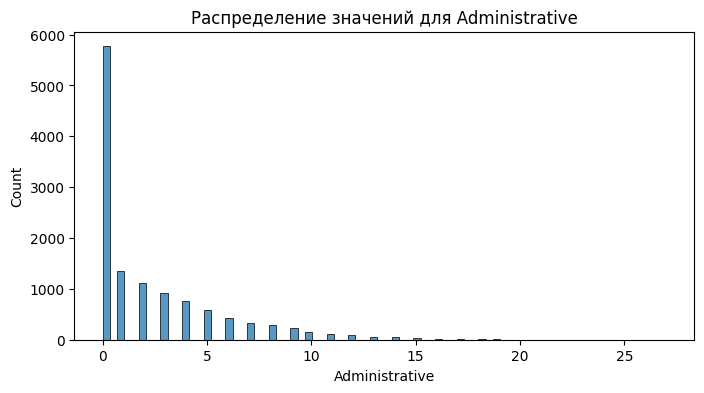

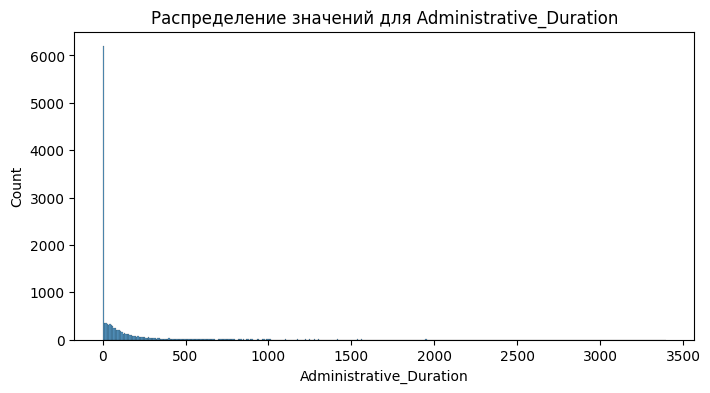

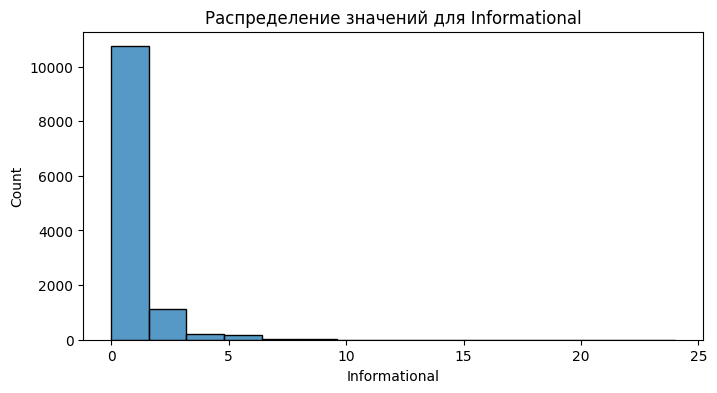

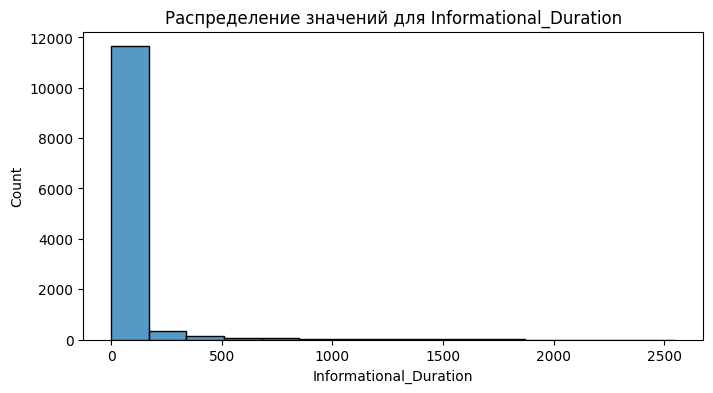

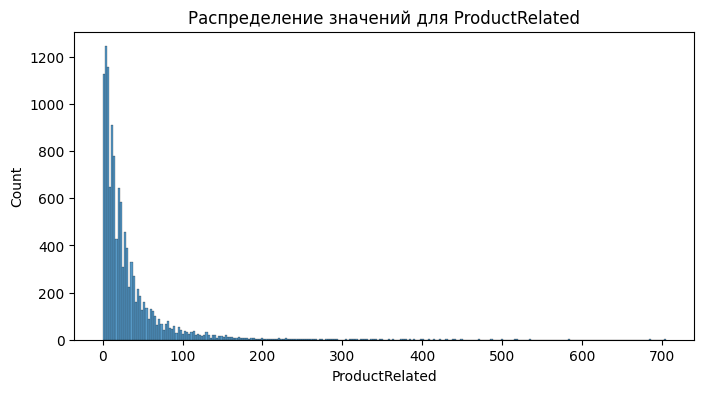

...

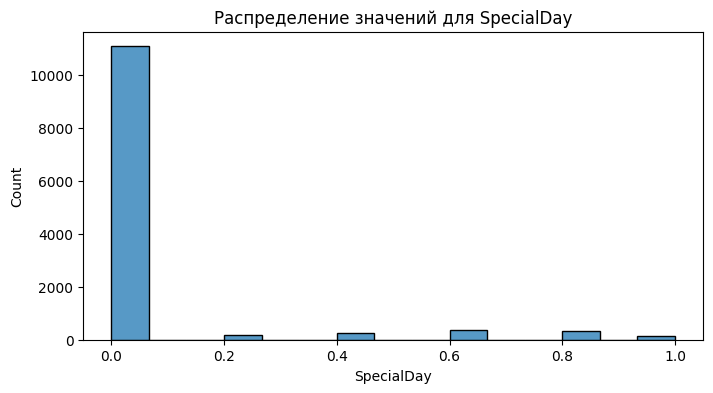

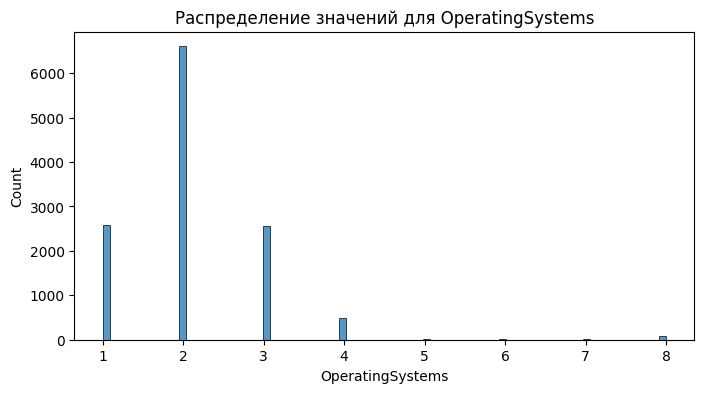

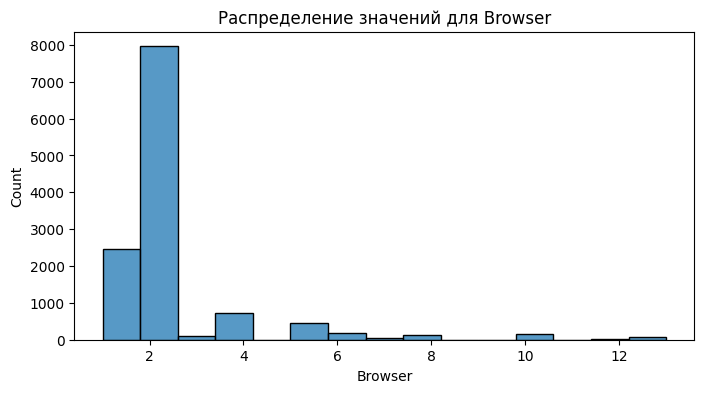

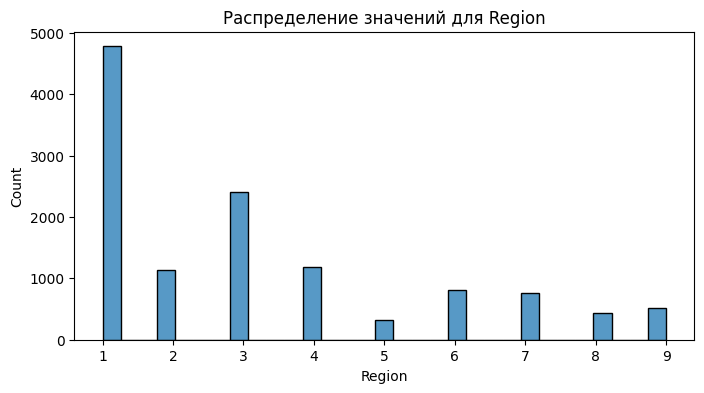

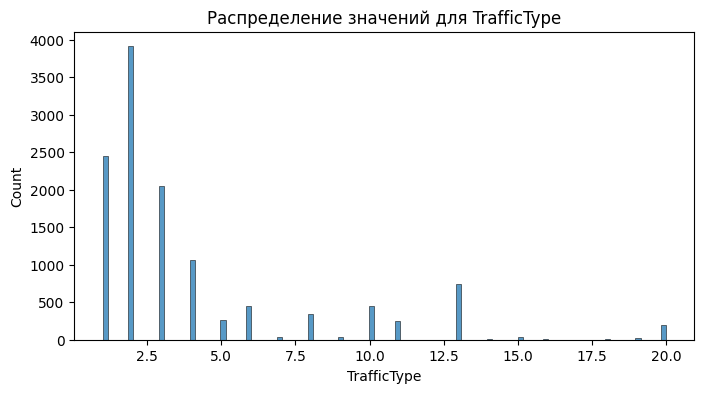

In [328]:
distribution_quan_feat(df)

1. Распределение сильно смещено влево:
- Логарифмическая трансформация может помочь снизизить влияиние выбросов

  - Данные отражают количественные счетчики, поэтому на графике отображено сильное смещение влево к нулю(например, малое количество действий с административными страницами).
      Administrative               
      Administrative_Duration    
      Informational                
      Informational_Duration     
      ProductRelated              
      ProductRelated_Duration

2. - Распределения признаков имеют сильный дисбаланс:
- Выбросы или крайние значения могут быть результатом редких действий (высокая ценность страниц, высокая частота покидания сайта).
- Такой характер распределения указывает на необходимость нормализации или использования методов преобразования данных для улучшения их пригодности при построении моделей машинного обучения.
      BounceRates                
      ExitRates                  
      PageValues                 

3. Классы-метки:
представляют категориальные или бинарные данные, которые указывают на определённый класс. В таких данных выбросы невозможны, так как их значения уже ограничены предопределёнными категориями или логическими значениями.
      SpecialDay                    
      Month                        
      OperatingSystems              
      Browser                      
      Region                        
      TrafficType                  
      VisitorType                   
      Weekend                       
      Revenue                       

In [329]:
def outliers(data):
    for column in data.columns:
      if data[column].dtype in ['float64', 'int64']:
        plt.figure(figsize=(8, 4))
        sns.boxplot(df[column])
        plt.title(f'Распределение значений для {column}')
        plt.show()

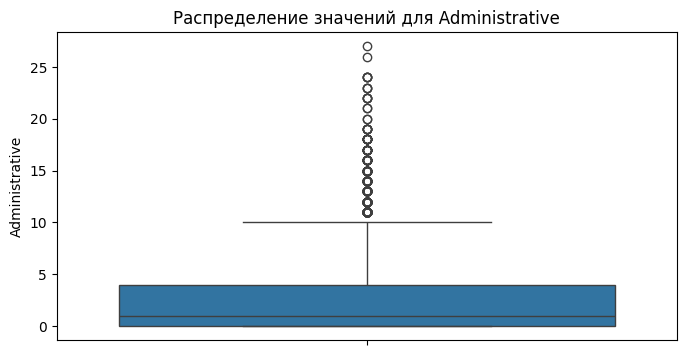

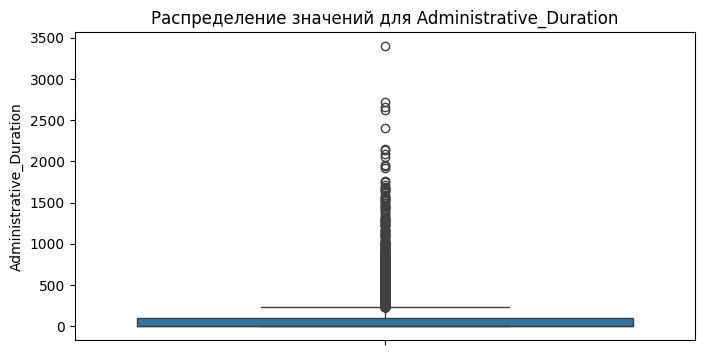

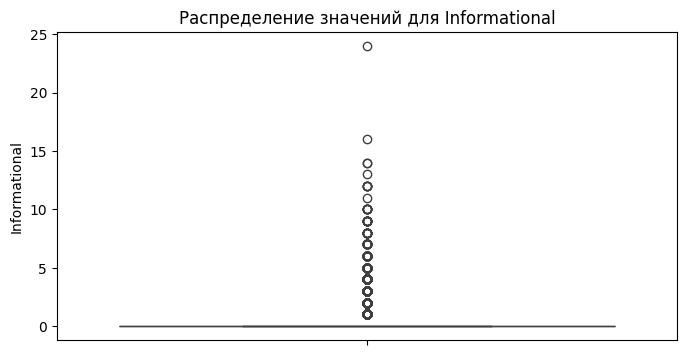

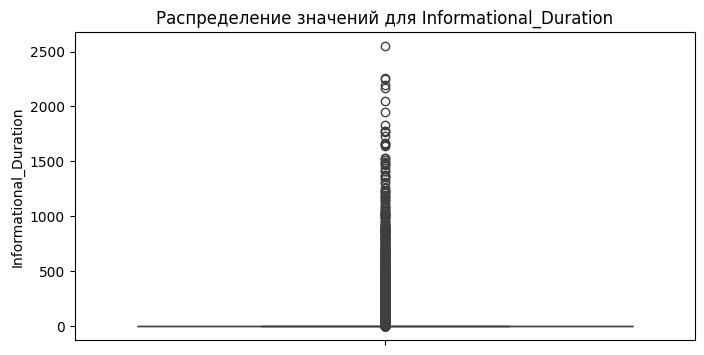

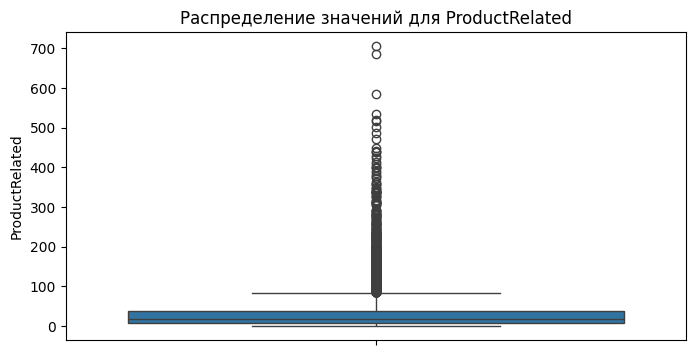

...

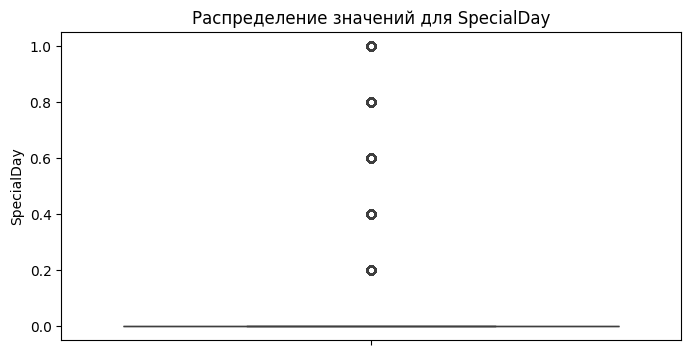

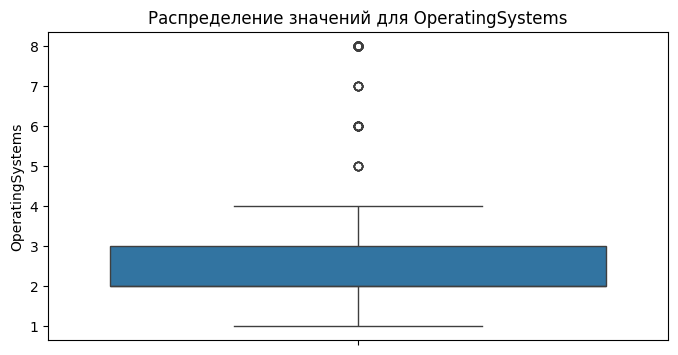

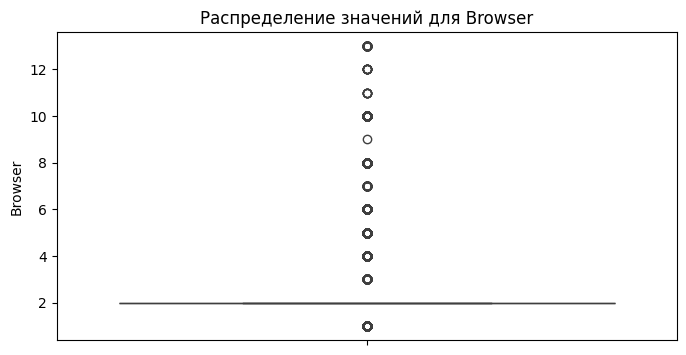

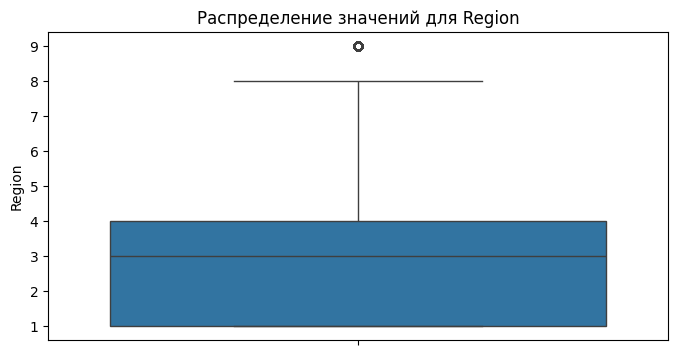

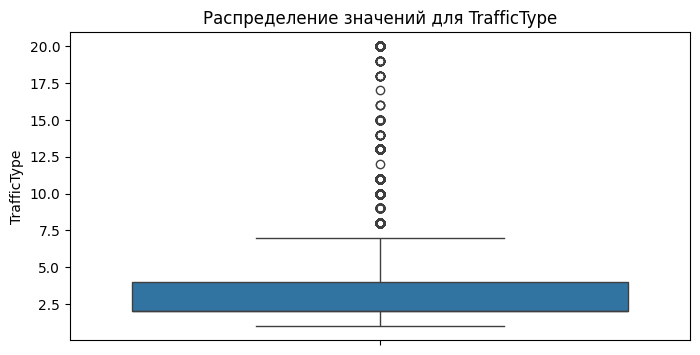

In [330]:
outliers(df)

In [ ]:
#Isolation Forest

In [331]:
numerical_columns = ["BounceRates", "ExitRates", "PageValues"]


filtered_df = df[numerical_columns].dropna()

clf = IsolationForest(contamination=0.05, random_state=42)  # 5% аномалий
filtered_df["Anomaly"] = clf.fit_predict(filtered_df)

# Метки аномалий: -1 для аномалий, 1 для нормальных
print(filtered_df["Anomaly"].value_counts())

anomalies = filtered_df[filtered_df["Anomaly"] == -1]
print("Detected Anomalies:")
print(anomalies)


Anomaly
 1    11933
-1      397
Name: count, dtype: int64
Detected Anomalies:
       BounceRates  ExitRates  PageValues  Anomaly
29        0.043478   0.050821   54.179764       -1
105       0.150000   0.150000    0.000000       -1
129       0.133333   0.166667    0.000000       -1
152       0.100000   0.150000    0.000000       -1
167       0.086667   0.166667    0.000000       -1
...            ...        ...         ...      ...
12115     0.008333   0.035417   60.977588       -1
12117     0.000000   0.014286  116.337865       -1
12187     0.058182   0.069394   39.038442       -1
12247     0.010088   0.035614  133.281379       -1
12272     0.002041   0.010884   97.860836       -1

[397 rows x 4 columns]


In [332]:
df = df.loc[filtered_df[filtered_df["Anomaly"] == 1].index, :]

In [ ]:
#Нормализация

In [333]:
target_columns = [
    "Administrative_Duration",
    "Informational",
    "Informational_Duration",
    "ProductRelated",
    "ProductRelated_Duration",
    "BounceRates",
    "ExitRates",
    "PageValues"
]

scaler = MinMaxScaler()

df[target_columns] = scaler.fit_transform(df[target_columns])

In [334]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.000000,0.0,0.0,0.001418,0.000000,1.000000,1.000000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.000000,0.0,0.0,0.002837,0.001000,0.000000,0.500000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.000000,0.0,0.0,0.001418,0.000000,1.000000,1.000000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.000000,0.0,0.0,0.002837,0.000042,0.250000,0.700000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.000000,0.0,0.0,0.014184,0.009809,0.100000,0.250000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,0.042663,0.0,0.0,0.075177,0.027883,0.035714,0.145153,0.131717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.000000,0.0,0.0,0.007092,0.007280,0.000000,0.106667,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.000000,0.0,0.0,0.008511,0.002880,0.416667,0.433333,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,0.022067,0.0,0.0,0.021277,0.005408,0.000000,0.105263,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


# **Выводы**

1. Сохранение количественных счетчиков и меток:  
   Количественные признаки и метки, важные для анализа данных, оставлены без изменений, поскольку они отображают реальные характеристики и распределения в наборе данных, что нужно для точного моделирования.

2. Удаление аномалий:  
   Для очистки данных и улучшения качества анализа была выполнена обработка аномалий при помощи алгоритма Isolation Forest. Этот метод выделяет нетипичные значения, эффективно удаляя шум, характерный для больших наборов данных.  


3. Нормализация данных:  
   Все числовые признаки прошли нормализацию (от 0 до 1), чтобы они имели единый масштаб. Данный шаг особенно важен для моделей, чувствительных к масштабам данных, например, линейных моделей или методов, использующих градиенты.

# Cвязь с целевой переменной

In [335]:
def correlation_columns(data, target_column=None):
    numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns

    correlations = {}
    for column in numeric_columns:
        if column != target_column:
            correlations[column] = data[column].corr(data[target_column]) if target_column else None

    return correlations


In [336]:
correlation_columns(df,target_column='Revenue')

{'Administrative': 0.14617953772926273,
 'Administrative_Duration': 0.09599758743670607,
 'Informational': 0.10164958296532861,
 'Informational_Duration': 0.07424643640766201,
 'ProductRelated': 0.16354247299290572,
 'ProductRelated_Duration': 0.15245441173874738,
 'BounceRates': -0.1397775026318431,
 'ExitRates': -0.1946582785186272,
 'PageValues': 0.5499837708914169,
 'SpecialDay': -0.07593295381670599,
 'OperatingSystems': -0.020108946832413564,
 'Browser': 0.013196144721918456,
 'Region': -0.018705055651392247,
 'TrafficType': -0.0087386782504032}

1. Наибольшая положительная корреляция:
   - PageValues (0.55) — самый сильный положительный фактор, влияющий на целевую переменную. Чем выше значение страницы, тем больше вероятность успеха.

2. Умеренная положительная корреляция:
   - ProductRelated (0.16) и ProductRelated_Duration (0.15) — интерес к продуктам и время, проведенное на связанных страницах, положительно коррелируют с целевой переменной.
   - Administrative (0.15) и Administrative_Duration (0.10) — меньшее влияние, но также положительное.

3. Слабая положительная корреляция:
   - Informational (0.10) и Informational_Duration (0.07) — слабая положительная связь, показывающая минимальное влияние информации.

4. Наибольшая отрицательная корреляция:
   - ExitRates (-0.19) и BounceRates (-0.14) — высокая частота выхода с сайта или отказ от взаимодействия снижает вероятность успеха.

5. Слабая отрицательная корреляция:
   - SpecialDay (-0.07) — влияние особых дней негативное и слабое.
   - OperatingSystems, Browser, Region, TrafficType — менее значимые факторы с корреляцией около нуля.

In [339]:
profile_report = ProfileReport(df, title='Pandas Profiling Report')

In [340]:
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [341]:
profile_report.to_file('Shoppers_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Матрицы корреляций

<Axes: >

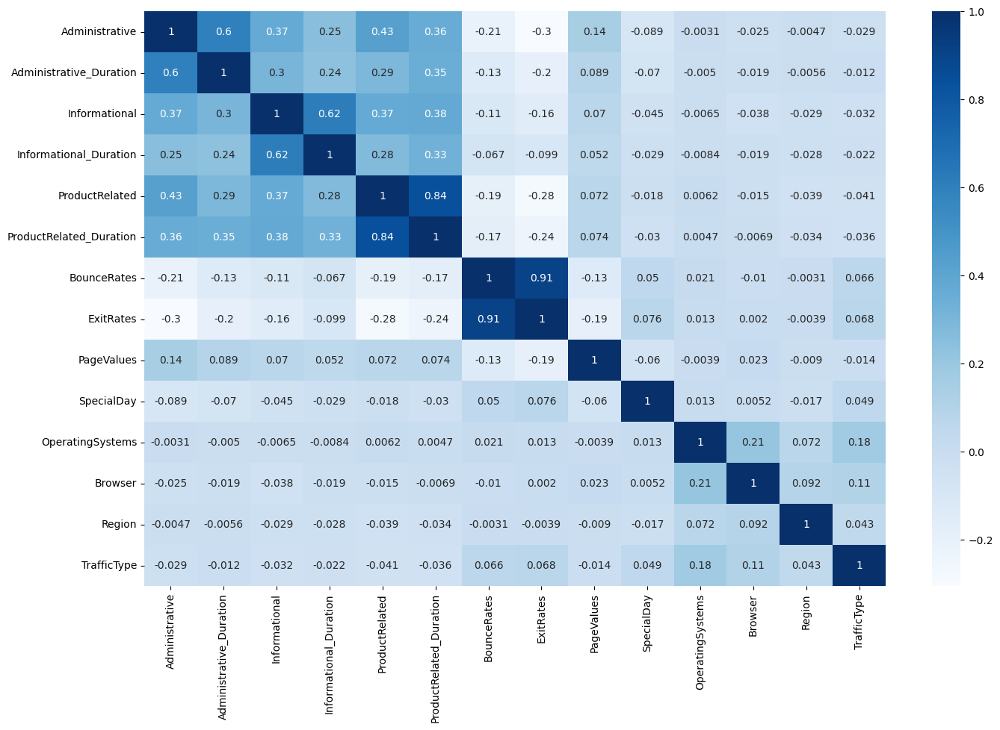

In [342]:
numeric_df = df.select_dtypes(include=['float64', 'int64'])

corr_matrix = numeric_df.corr()

plt.figure(figsize=(16, 10))

sns.heatmap(corr_matrix, cmap="Blues", annot=True)

1. Высокая корреляция между переменными:
   - ProductRelated и ProductRelated_Duration (0.84): Логично, что количество страниц, связанных с продуктами, и потраченное на них время сильно связаны.
   - **ExitRates и BounceRates** (0.91): Высокая связь между отказами и частотой выхода с сайта.

2. Средняя корреляция:
   - Administrative и Administrative_Duration (0.63): Чем больше административных страниц посещено, тем больше времени на них тратится.
   - Informational и Informational_Duration (0.62): Количество информационных страниц также связано с временем на них.
   - **PageValues с факторами ProductRelated** (0.49): Посещения продуктов положительно коррелируют со значением страницы.

3. Низкая корреляция с большинством категорий:
   - Поведенческое влияние (BounceRates, ExitRates) не связано напрямую с Informational, Administrative, а скорее с низкой ценностью страниц (PageValues).
   - Технические параметры — такие как OperatingSystems, Browser, Region, TrafficType — практически независимы друг от друга и от целевых показателей. Корреляция незначительна.

4. Отрицательная корреляция:
   - Умеренная отрицательная связь у BounceRates и PageValues (-0.49): Чем меньше отказы, тем выше ценность страниц.
   - Аналогично, у ExitRates и PageValues (-0.50).

In [352]:
df_cat = df.apply(lambda x: x.astype("category") if x.dtype == "object" else x)

cramersv = am.CramersV(df_cat)

cramersv.fit()

/usr/local/lib/python3.10/dist-packages/association_metrics/categorical.py:100: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  self.matrix[x][y] = 1
/usr/local/lib/python3.10/dist-packages/association_metrics/categorical.py:104: FutureWarning

,Month,VisitorType
Month,1.000000,0.136322
VisitorType,0.136322,1.000000


Значение 0.1363 указывает на низкую положительную корреляцию.

In [346]:
Data = []

for c1 in df.columns:
    for c2 in df.columns:
        if df[c1].dtype == 'object' and df[c2].dtype != 'object':
            CategoryGroupLists = df.groupby(c1)[c2].apply(list)
            AnovaResults = f_oneway(*CategoryGroupLists)

            if AnovaResults[1] >= 0.05:
                Data.append({'Category' : c1, 'Numerical' : c2, 'Is correlated' : 'No'})
            else:
                Data.append({'Category' : c1, 'Numerical' : c2, 'Is correlated' : 'Yes'})

AnovaRes = pd.DataFrame.from_dict(Data)
AnovaRes

,Category,Numerical,Is correlated
0,Month,Administrative,Yes
1,Month,Administrative_Duration,Yes
2,Month,Informational,Yes
3,Month,Informational_Duration,Yes
4,Month,ProductRelated,Yes
5,Month,ProductRelated_Duration,Yes
6,Month,BounceRates,Yes
7,Month,ExitRates,Yes
8,Month,PageValues,Yes
9,Month,SpecialDay,Yes


In [348]:
data =  df

In [349]:
data['Revenue'] = data['Revenue'].astype(int)  # Преобразуем True/False в 1/0 для анализа

# Получаем список числовых и категориальных признаков
numerical_features = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = data.select_dtypes(include=['object']).columns.tolist()

# Тесты для числовых признаков
for feature in numerical_features:
    if feature != 'Revenue':
        group1 = data[data['Revenue'] == 1][feature]
        group0 = data[data['Revenue'] == 0][feature]

        # Выполняем t-тест
        t_stat, p_value = stats.ttest_ind(group1, group0, equal_var=False)  # равенство дисперсий
        print(f"T-test for {feature}: t-statistic = {t_stat}, p-value = {p_value}")

# Тесты для категориальных признаков
for feature in categorical_features:
    if feature != 'Revenue':
        contingency_table = pd.crosstab(data[feature], data['Revenue'])

        # Выполняем тест хи-квадрат
        if contingency_table.shape[0] > 1 and contingency_table.shape[1] > 1:
            chi2, p, _, _ = stats.chi2_contingency(contingency_table)
            print(f"Chi-squared test for {feature}: chi2 = {chi2}, p-value = {p}")


T-test for Administrative: t-statistic = 14.397455193121052, p-value = 5.14620405159701e-45
T-test for Administrative_Duration: t-statistic = 9.436232894966892, p-value = 9.309025500850665e-21
T-test for Informational: t-statistic = 9.403844752847217, p-value = 1.2922514195134796e-20
T-test for Informational_Duration: t-statistic = 6.750802425326728, p-value = 1.885489002399513e-11
T-test for ProductRelated: t-statistic = 13.984686915233455, p-value = 1.5541785698256718e-42
T-test for ProductRelated_Duration: t-statistic = 13.87426575607702, p-value = 5.6412258262910857e-42
T-test for BounceRates: t-statistic = -32.6836752372834, p-value = 4.474383900072609e-224
T-test for ExitRates: t-statistic = -41.67708102784805, p-value = 0.0
T-test for PageValues: t-statistic = 37.7367502568945, p-value = 3.049651664543703e-231
T-test for SpecialDay: t-statistic = -11.603752244069891, p-value = 1.3369413715137041e-30
T-test for OperatingSystems: t-statistic = -2.245437978957819, p-value = 0.02482

Признаки со значимым влиянием (p-value < 0.05):
1. Administrative (p-value = 5.14e-45): Число посещённых "административных" страниц статистически различается для пользователей, которые участвовали и не участвовали в доходе.
2. Administrative_Duration (p-value = 9.31e-21): Длительность пребывания на "административных" страницах также влияет на целевую переменную.
3. Informational (p-value = 1.29e-20): Количество посещений информационных страниц имеет значимую связь с целевым признаком.
4. Informational_Duration (p-value = 1.89e-11): Время, проведённое на информационных страницах, связано с доходом.
5. ProductRelated (p-value = 1.55e-42): Количество посещённых страниц товаров имеет большое влияние на выходной показатель.
6. ProductRelated_Duration (p-value = 5.64e-42): Длительность взаимодействия с товарными страницами также значима.
7. BounceRates (p-value = 4.47e-224): Показатель отказов статистически связан с Revenue (чем выше показатель отказов, тем меньше вероятность покупки).
8. ExitRates (p-value = 0.0): Частота выхода с сайта имеет статистически значимое влияние.
9. PageValues (p-value = 3.05e-231): Значение страницы (Page Value = конверсия страницы) также сильно связано с целевым признаком.
10. SpecialDay (p-value = 1.34e-30): Вероятность покупки коррелирует со спецификой дня (например, акционные дни).

Признаки со слабым влиянием (p-value близкое к 0.05):
1. OperatingSystems (p-value = 0.024): Операционные системы имеют небольшое влияние.
2. Region (p-value = 0.039): Регион вносит статистически значимое, но сравнительно слабое влияние.

Признаки без значимого влияния (p-value > 0.05):
1. Browser (p-value = 0.166): Тип браузера не оказывает значимого влияния.
2. TrafficType (p-value = 0.328): Тип источника трафика также не показывает связи с целевым признаком.

#**Выводы**

- Для прогнозирования или анализа Revenue наибольшее значение имеют поведенческие признаки (PageValues, ProductRelated, ProductRelated_Duration, BounceRates, ExitRates).
- Технические параметры и некоторые базовые метрики (TrafficType, Browser) являются практически нерелевантными для таргета.

#Анализ целевой переменной

<Axes: xlabel='Revenue', ylabel='count'>

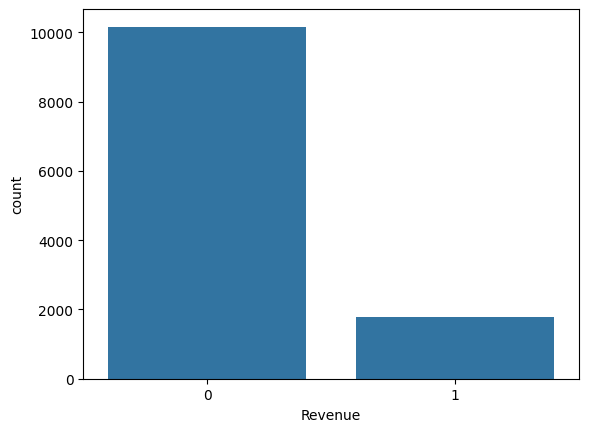

In [350]:
sns.countplot(x = data['Revenue'])

<Axes: xlabel='Revenue', ylabel='Density'>

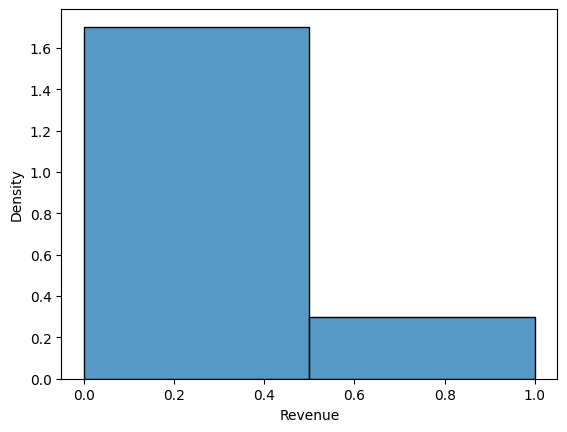

In [351]:
sns.histplot(x = data['Revenue'], bins=2, kde=False, stat="density")

<ipython-input-355-fe2faa72da00>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Revenue', palette='viridis')


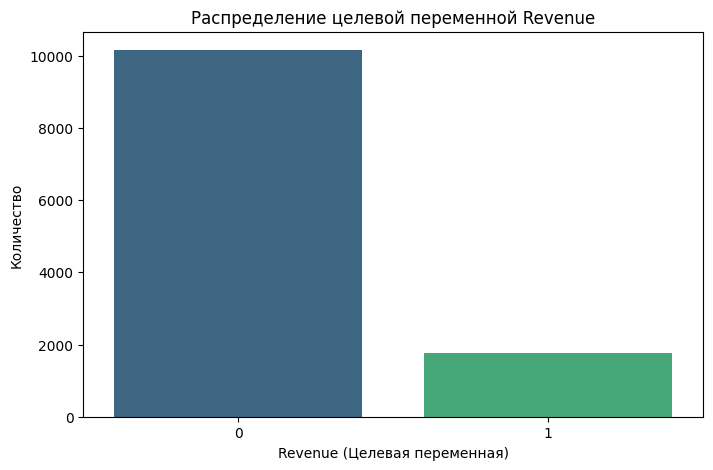

Распределение классов:
Revenue
0    0.85142
1    0.14858
Name: proportion, dtype: float64
Статистики по целевой переменной:
         Administrative  Administrative_Duration  Informational  \
Revenue                                                           
0              2.154921                 0.022053       0.019090   
1              3.525663                 0.036158       0.034334   

         Informational_Duration  ProductRelated  ProductRelated_Duration  \
Revenue                                                                    
0                      0.011974        0.041357                 0.016657   
1                      0.023639        0.070633                 0.029360   

         BounceRates  ExitRates  PageValues  SpecialDay  OperatingSystems  \
Revenue                                                                     
0           0.116150   0.225155    0.018454    0.065846          2.127362   
1           0.023489   0.097042    0.225427    0.023914          2.0761

In [355]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x='Revenue', palette='viridis')
plt.title("Распределение целевой переменной Revenue")
plt.xlabel("Revenue (Целевая переменная)")
plt.ylabel("Количество")
plt.show()

# 2. Проверка на баланс классов для бинарной переменной
target_balance = df['Revenue'].value_counts(normalize=True)
print("Распределение классов:")
print(target_balance)

# 3. Расчёт основных статистик по Revenue
print("Статистики по целевой переменной:")
print(df[numerical_features].groupby('Revenue').mean())
print(df[numerical_features].groupby('Revenue').median())

### **Общие выводы:**
1. **Ключевое различие:** Пользователи, совершившие покупку (Revenue = 1), взаимодействуют больше с разделами, связанными с товарами, и проводят больше времени на сайте. У них ниже показатель отказов и выше PageValues.
2. **Дисбаланс классов:** Необходимо учитывать этот дисбаланс при обучении модели. Например, метрика **ROC AUC** будет более показательной, чем Accuracy.
3. **Стратегия анализа:**
   - Использовать признаки, связанные с поведением пользователя (BounceRates, ExitRates, ProductRelated).
   - Внешние признаки можно уточнить дополнительно, так как пока влияние ограничено.
